In [11]:
# import required libraries
import pandas as pd
import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import rbf_kernel
import matplotlib.pyplot as plt
import os
import seaborn as sns

In [12]:
# load physiological data from a file
# the file should be in tab-separated format with specific columns
def load_data(file_path):
    columns = ["time", "ECG", "BVP", "GSR", "Resp", "Skin_Temp", "EMG_z", "EMG_c", "EMG_t"]
    df = pd.read_csv(file_path, sep="\t", names=columns)
    return df

# load valence and arousal data from a file
# the file should be in tab-separated format with specific columns
def load_valence_arousal_data(file_path):
    columns = ["jstime", "valence", "arousal"]
    df = pd.read_csv(file_path, sep="\t", names=columns)
    return df

def load_data_mod(file_path):
    columns = ["time", "ECG", "BVP", "GSR", "Resp", "Skin_Temp", "EMG_z", "EMG_c", "EMG_t", "valence", "arousal"]
    df = pd.read_csv(file_path, sep="\t", names=columns)
    return df

In [13]:
# segment into 5-second windows
def segment_data(df, window_size):
    start_time = df["time"].min()
    df["window"] = ((df["time"] - start_time) // window_size).astype(int)
    return df.groupby("window").mean().reset_index()

In [14]:
# RuLSIF Algorithm for Change-Point Detection
def compute_rulsif_change_scores(X, alpha=0.1, sigma=1.0, lambda_param=1e-3):
    n = len(X) - 1
    change_scores = np.zeros(n)
    
    for i in range(n):
        X_t, X_t_next = X[i], X[i + 1]
        
        # compute Gaussian Kernel Matrix
        K_t = rbf_kernel(X_t.reshape(-1, 1), X_t.reshape(-1, 1), gamma=1/(2*sigma**2))
        K_t_next = rbf_kernel(X_t_next.reshape(-1, 1), X_t_next.reshape(-1, 1), gamma=1/(2*sigma**2))
        
        # compute Weights using Least Squares Importance Fitting (LSIF)
        H = alpha * K_t + (1 - alpha) * K_t_next + lambda_param * np.eye(K_t.shape[0])
        h = np.mean(K_t, axis=1)
        
        theta = np.linalg.solve(H, h)
        
        # compute Change Score
        change_scores[i] = np.mean(np.square(K_t_next.dot(theta) - 1))
    return change_scores

In [15]:
# identify significant changes and label opportune moments
def label_opportune_moments(change_scores):
    mean, std = np.mean(change_scores), np.std(change_scores)
    threshold = mean + 3 * std
    outliers = change_scores > threshold

    # clustering the remaining scores
    valid_scores = change_scores[~outliers]
    kmeans = KMeans(n_clusters=2, random_state=42).fit(valid_scores.reshape(-1, 1))
    centroids = kmeans.cluster_centers_.flatten()
    high_cluster = np.argmax(centroids)
    high_values = (kmeans.labels_ == high_cluster) & (valid_scores > centroids[high_cluster])

    # create a full-length boolean mask for high_values
    high_mask = np.zeros_like(change_scores, dtype=bool)
    high_mask[~outliers] = high_values  # map back to original indices

    # mark opportune moments
    opportune_moments = np.where(outliers | high_mask)[0]
    return opportune_moments


In [16]:
# plot graphs
def plot_cscore_valence(opportune_moments, change_scores, segmented_data, i, save_dirs):
    
    cScores = []
    valenceAtOpportuneMoments = []

    for moment in opportune_moments:
        cScores.append(change_scores[moment])
        valenceAtOpportuneMoments.append(segmented_data['valence'].iloc[moment])

    # Optional: sort by valence
    paired = sorted(zip(valenceAtOpportuneMoments, cScores))
    x_sorted, y_sorted = zip(*paired)

    # Create save directory if it doesn't exist
    os.makedirs(save_dirs, exist_ok=True)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(x_sorted, y_sorted, marker='o')

    plt.xlabel('Valence at Opportune Moments')
    plt.ylabel('Change Score')
    plt.title(f'Change Scores vs Valence at Opportune Moments for User {i}')
    plt.axhline(y=np.mean(cScores), color='r', linestyle='--', label='Mean Change Score')
    plt.axvline(x=np.mean(valenceAtOpportuneMoments), color='g', linestyle='--', label='Mean Valence')
    plt.grid(True)
    plt.tight_layout()

    # Save the plot
    filename = os.path.join(save_dirs, f'user_{i}_valence_vs_cscore.png')
    plt.savefig(filename)
    print(f"Plot saved to {filename}")

    # Show the plot
    # plt.show()

In [17]:
# distribution of valence values at opportune moments and non opportune moments
def plot_valence_dist(opportune_moments, segmented_data, j, save_dirs):
    valenceAtOpportuneMoments = []
    valenceAtNonOpportuneMoments = []

    for moment in opportune_moments:
        valenceAtOpportuneMoments.append(segmented_data['valence'].iloc[moment])

    # Get all indices of segmented_data
    all_indices = set(range(len(segmented_data)))

    # Compute non-opportune indices
    non_opportune_indices = all_indices - set(opportune_moments)

    # Append valence values at non-opportune moments
    for i in sorted(non_opportune_indices):
        valenceAtNonOpportuneMoments.append(segmented_data['valence'].iloc[i])

    # Prepare data for seaborn
    data = pd.DataFrame({
        'Valence': valenceAtOpportuneMoments + valenceAtNonOpportuneMoments,
        'Group': ['Opportune'] * len(valenceAtOpportuneMoments) + ['Non-Opportune'] * len(valenceAtNonOpportuneMoments)
    })

    os.makedirs(save_dirs, exist_ok=True)

    # Create violin plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


    plt.title('Valence Distribution: Opportune vs Non-Opportune Moments for User {}'.format(j))
    plt.ylabel('Valence')
    plt.xlabel('Moment Type')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()

    # Save the plot
    filename = os.path.join(save_dirs, f'user_{j}_opp_vs_nonopp.png')
    plt.savefig(filename)
    print(f"Plot saved to {filename}")


    # fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

    # # Violin plot for opportune moments
    # sns.violinplot(data=valenceAtOpportuneMoments, ax=axes[0], inner='box', color='skyblue')
    # axes[0].set_title('Opportune Moments')
    # axes[0].set_ylabel('Valence')
    # axes[0].set_xlabel('')
    # axes[0].grid(True, linestyle='--', alpha=0.5)

    # # Violin plot for non-opportune moments
    # sns.violinplot(data=valenceAtNonOpportuneMoments, ax=axes[1], inner='box', color='lightgreen')
    # axes[1].set_title('Non-Opportune Moments')
    # axes[1].set_ylabel('Valence')
    # axes[1].set_xlabel('')
    # axes[1].grid(True, linestyle='--', alpha=0.5)

    # # Layout adjustments
    # plt.suptitle('Valence Distribution Comparison for user {}'.format(i))
    # plt.tight_layout(rect=[0, 0, 1, 0.95])

    # # Save the plot
    # filename = os.path.join(save_dirs, f'user_{i}opp_vs_nonopp.png')
    # plt.savefig(filename)
    # print(f"Plot saved to {filename}")

    # plt.show()

Plot saved to plots/2_sec_window\user_1_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_1_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_2_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_2_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_3_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_3_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_4_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_4_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_5_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_5_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_6_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_6_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_7_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_7_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_8_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_8_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_9_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_9_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_10_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_10_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})
C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2647675711.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 5))
C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and s

Plot saved to plots/2_sec_window\user_11_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_11_opp_vs_nonopp.png
Plot saved to plots/2_sec_window\user_12_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_12_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_13_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_13_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_14_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_14_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_15_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_15_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_16_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_16_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_17_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_17_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_18_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_18_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_19_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_19_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_20_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_20_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_21_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_21_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_22_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_22_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_23_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_23_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_24_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_24_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_25_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_25_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_26_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_26_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_27_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_27_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_28_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_28_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_29_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_29_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/2_sec_window\user_30_valence_vs_cscore.png
Plot saved to plots/2_sec_distribution\user_30_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_1_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_1_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_2_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_2_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_3_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_3_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_4_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_4_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_5_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_5_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_6_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_6_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_7_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_7_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_8_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_8_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_9_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_9_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_10_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_10_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_11_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_11_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_12_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_12_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_13_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_13_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_14_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_14_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_15_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_15_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_16_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_16_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_17_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_17_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_18_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_18_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_19_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_19_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_20_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_20_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_21_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_21_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_22_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_22_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_23_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_23_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_24_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_24_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_25_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_25_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_26_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_26_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_27_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_27_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_28_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_28_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_29_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_29_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/5_sec_window\user_30_valence_vs_cscore.png
Plot saved to plots/5_sec_distribution\user_30_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_1_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_1_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_2_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_2_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_3_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_3_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_4_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_4_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_5_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_5_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_6_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_6_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_7_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_7_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_8_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_8_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_9_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_9_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_10_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_10_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_11_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_11_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_12_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_12_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_13_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_13_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_14_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_14_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_15_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_15_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_16_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_16_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_17_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_17_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_18_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_18_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_19_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_19_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_20_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_20_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_21_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_21_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_22_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_22_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_23_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_23_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_24_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_24_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_25_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_25_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_26_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_26_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_27_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_27_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_28_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_28_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_29_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_29_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/8_sec_window\user_30_valence_vs_cscore.png
Plot saved to plots/8_sec_distribution\user_30_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_1_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_1_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_2_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_2_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_3_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_3_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_4_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_4_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_5_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_5_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_6_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_6_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_7_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_7_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_8_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_8_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_9_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_9_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_10_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_10_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_11_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_11_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_12_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_12_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_13_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_13_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_14_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_14_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_15_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_15_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_16_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_16_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_17_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_17_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_18_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_18_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_19_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_19_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_20_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_20_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_21_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_21_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_22_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_22_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_23_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_23_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_24_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_24_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_25_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_25_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_26_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_26_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_27_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_27_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_28_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_28_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_29_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_29_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


Plot saved to plots/10_sec_window\user_30_valence_vs_cscore.png
Plot saved to plots/10_sec_distribution\user_30_opp_vs_nonopp.png


C:\Users\ajayc\AppData\Local\Temp\ipykernel_5780\2140643513.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='Valence', data=data, inner='box', palette={'Opportune': 'skyblue', 'Non-Opportune': 'lightgreen'})


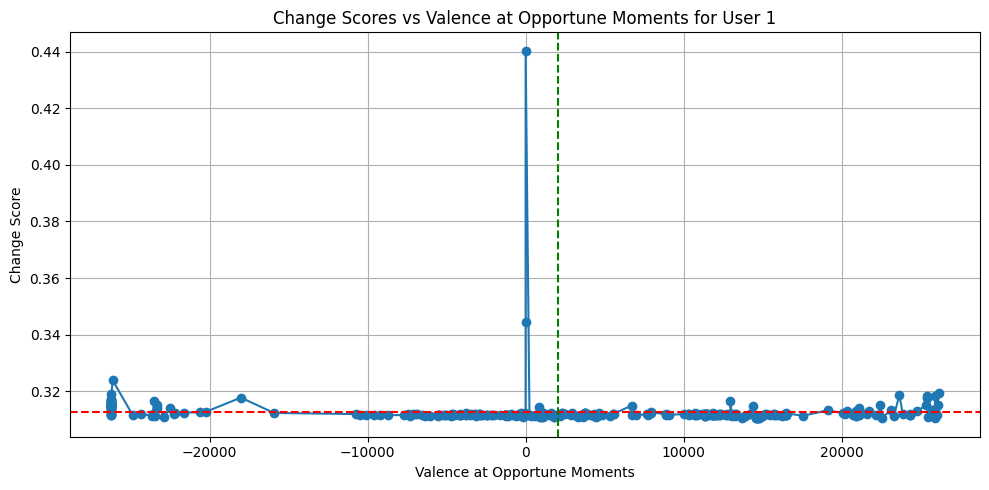

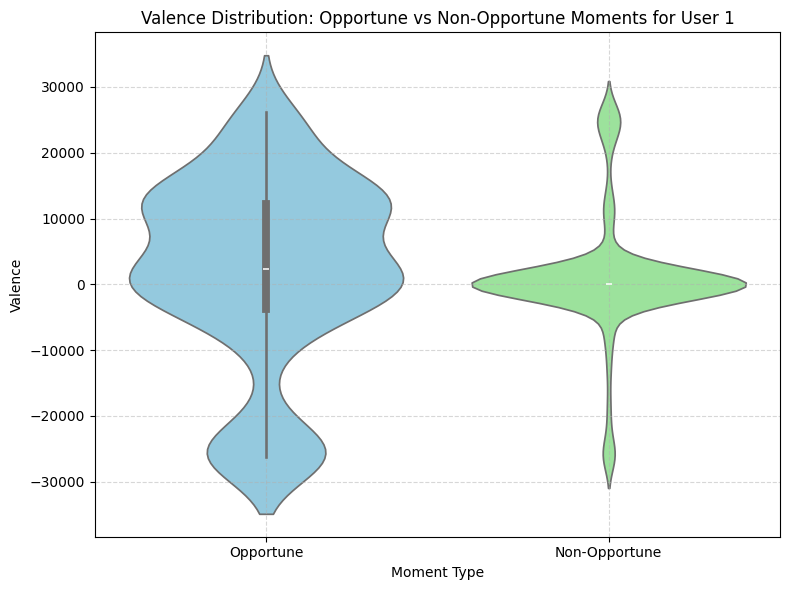

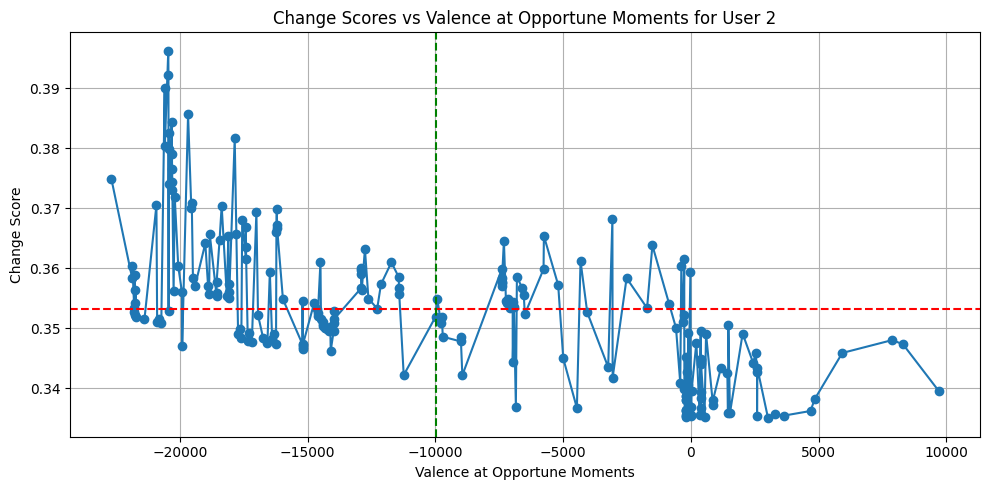

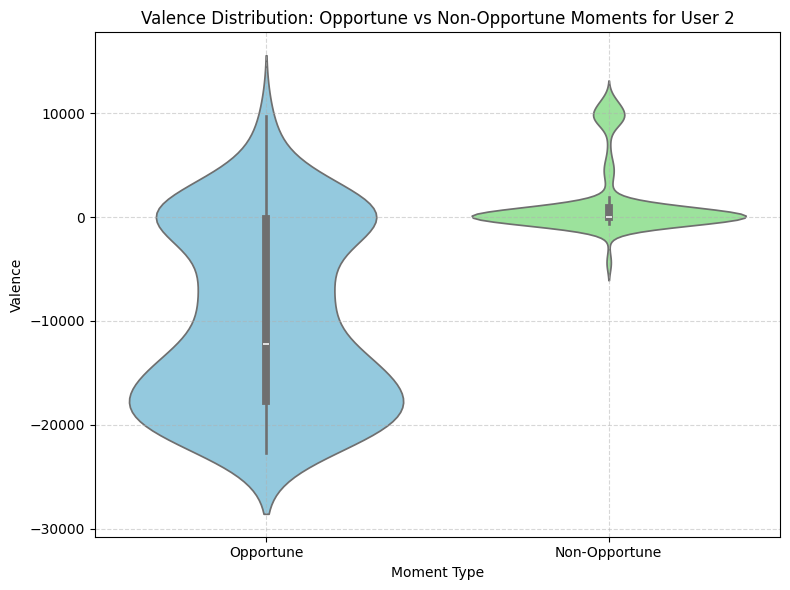

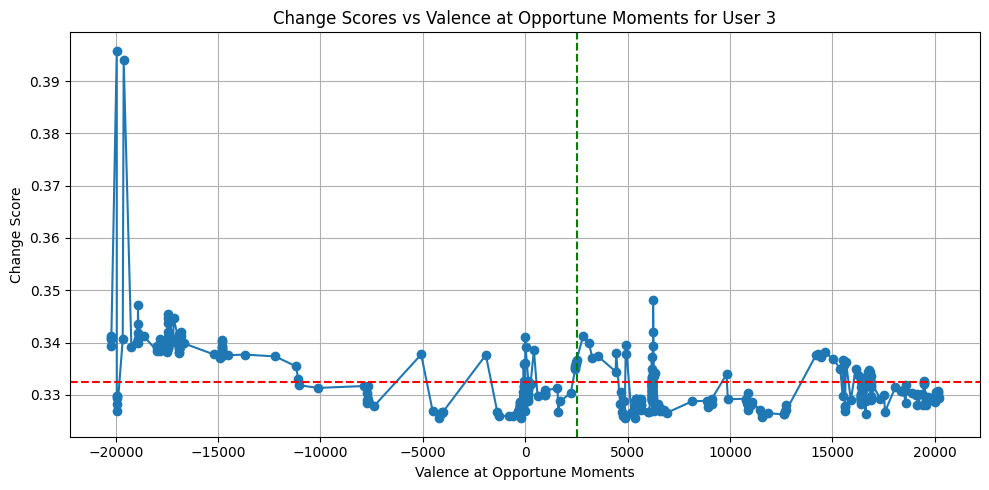

...

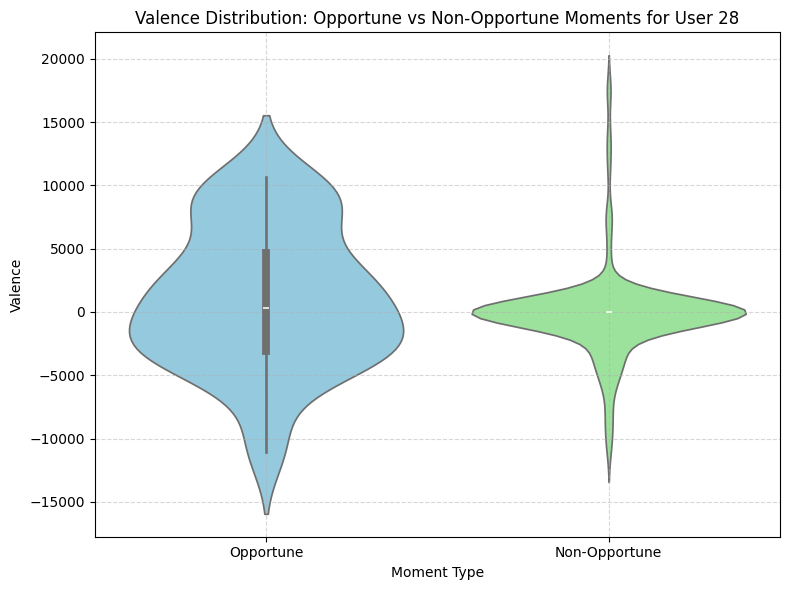

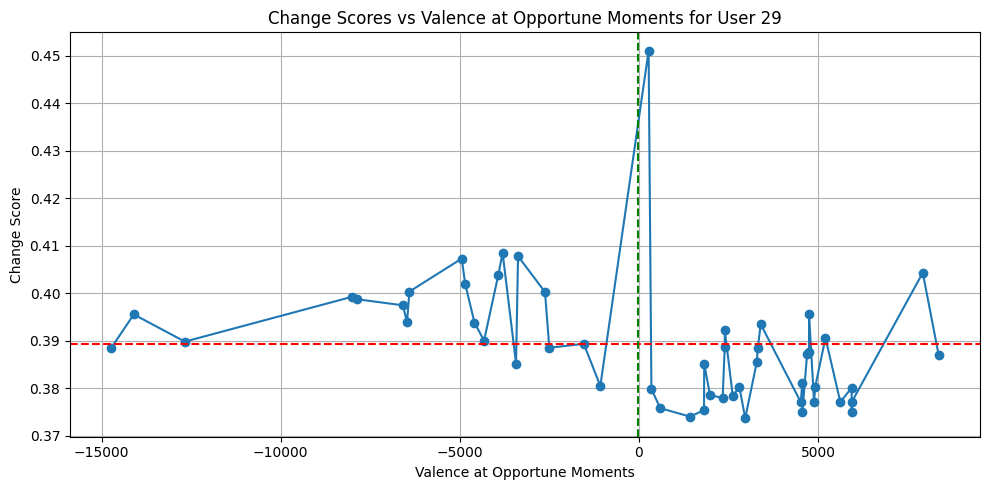

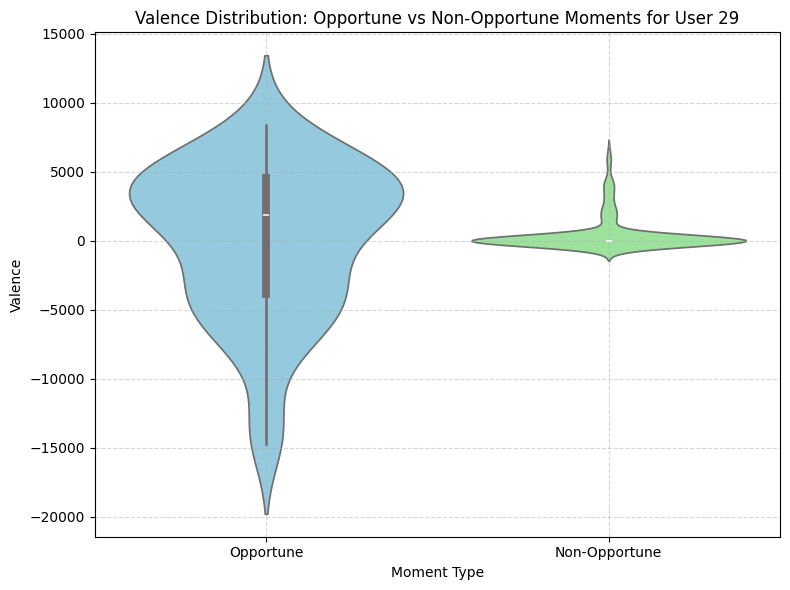

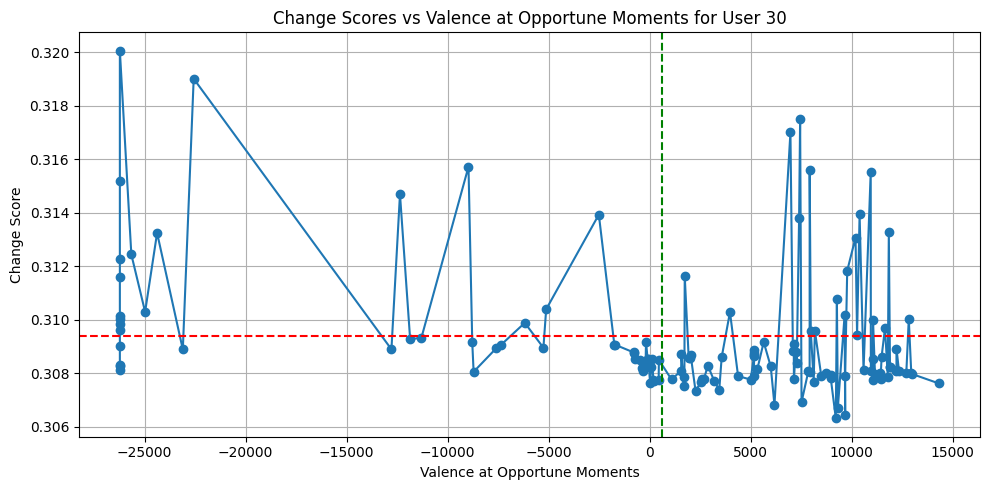

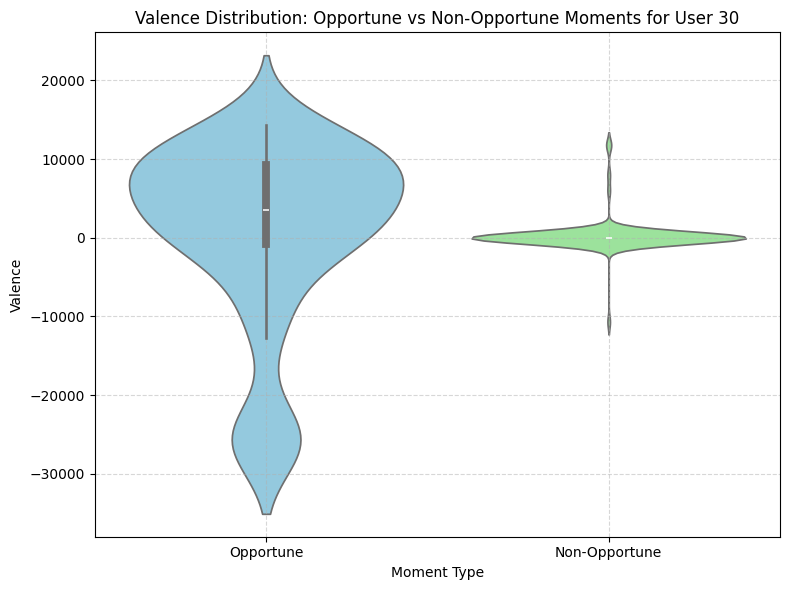

In [ ]:
# main execution
# load datasets
for window in [2, 5, 8, 10]:
    for i in range(1, 31):
        df_a = load_valence_arousal_data(f"case_dataset/data/raw/annotations/sub{i}_joystick.txt")
        df_b = load_data(f"case_dataset/data/raw/physiological/sub{i}_DAQ.txt")

        # create bin edges and labels
        bins = df_a['jstime'].tolist()
        labels = df_a['jstime'].iloc[1:].tolist()

        # bin df_b using pd.cut
        df_b['bin'] = pd.cut(df_b['time'], bins=bins, labels=labels, right=True)

        # drop the 'time' column BEFORE groupby to prevent it from being averaged
        df_b_no_time = df_b.drop(columns=['time'])

        # group by bin and compute mean
        df_b_grouped = df_b_no_time.groupby('bin', observed=False).mean(numeric_only=True).reset_index()

        # rename bin to 'time'
        df_b_grouped = df_b_grouped.rename(columns={'bin': 'time'})

        # add 'valence' and 'arousal' from df_a (excluding first row)
        df_b_grouped['valence'] = df_a['valence'].iloc[1:].values
        df_b_grouped['arousal'] = df_a['arousal'].iloc[1:].values

        # save to file
        df_b_grouped.to_csv(f'../modified_dataset/sub{i}_DAQ_mod.txt', sep='\t', index=False, header=False)

        file_path = f"../modified_dataset/sub{i}_DAQ_mod.txt"
        df_mod = load_data_mod(file_path)
        segmented_data = segment_data(df_mod, window)
        change_scores = compute_rulsif_change_scores(segmented_data.iloc[:, 1:].values)
        opportune_moments = label_opportune_moments(change_scores)

        # print("Opportune moments detected at windows:", opportune_moments)
        # print("Change scores:", change_scores)

        # plot the graphs
        plot_cscore_valence(opportune_moments, change_scores, segmented_data, i, f"plots/{window}_sec_window")
        plot_valence_dist(opportune_moments, segmented_data, i, f"plots/{window}_sec_distribution")